In [1]:
import sys, os
sys.path.insert(0, os.path.abspath('..'))

import pandas as pd
import geopandas as gpd

%load_ext autoreload
%autoreload 2

from src.config import *
from src import clustering as cl

In [2]:
gdf = gpd.read_file(BASE_DIR / 'data' / 'processed' / 'combined_data.gpkg')
pd.options.display.float_format = '{:,.2f}'.format

## Initial tests

Clustering Metrics for kmeans with PCA of 2:
  Silhouette Score: 0.14583382785447568
  Davies-Bouldin Index: 1.7331771504979276
  Calinski-Harabasz Index: 1224.9095611637078

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants
cluster                                                                                                                                                                                                                                                                                
0                                        0.49     -0.92                         1.17                                  0.05                                     0.77                       -0.33                               0

(<Figure size 1000x600 with 4 Axes>,
 <Axes: title={'center': 'Clustering Map'}>)

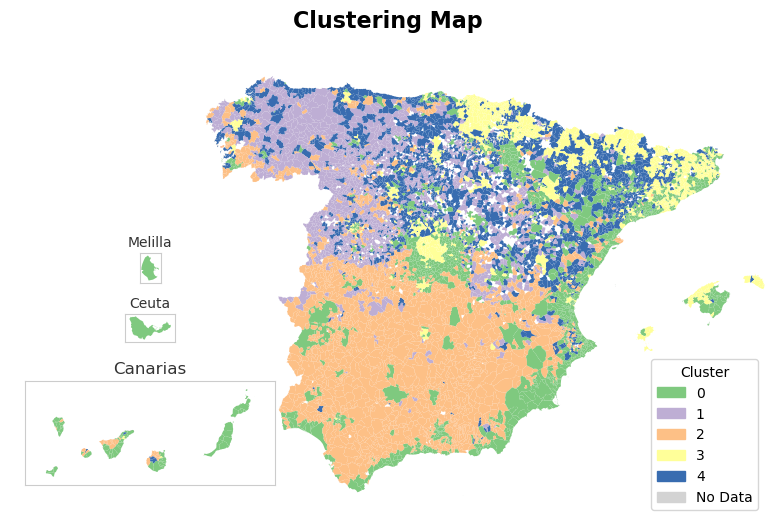

In [3]:
gdf_cluster, metrics, centroids  = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_DENSITY,
        V_MEAN_AGE,
        V_FOREIGN_POPULATION,
        V_HIGHER_EDUCATION,
        V_POPULATION_CHANGE,
        V_MEAN_NET_INCOME,
        V_UNEMPLOYMENT,
        V_AFFILIATION
        ],
    n_clusters=5,
    apply_pca=True,
    pca_components=2
    )

cl.plot_cluster_map(gdf_cluster)

Clustering Metrics for gaussian with PCA of 2:
  Silhouette Score: 0.14328383172399442
  Davies-Bouldin Index: 1.80336054407119
  Calinski-Harabasz Index: 1211.8730651055043

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants
cluster                                                                                                                                                                                                                                                                                
0                                        0.48     -0.96                         1.22                                  0.06                                     0.78                       -0.34                               0

(<Figure size 1000x600 with 4 Axes>,
 <Axes: title={'center': 'Clustering Map'}>)

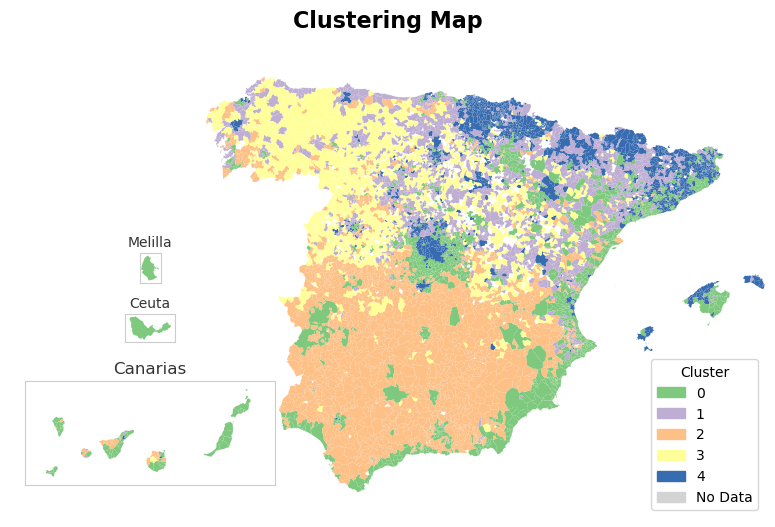

In [4]:
gdf_cluster, metrics, centroids  = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_DENSITY,
        V_MEAN_AGE,
        V_FOREIGN_POPULATION,
        V_HIGHER_EDUCATION,
        V_POPULATION_CHANGE,
        V_MEAN_NET_INCOME,
        V_UNEMPLOYMENT,
        V_AFFILIATION
        ],
    algorithm='gaussian',
    n_clusters=5,
    apply_pca=True
    )

cl.plot_cluster_map(gdf_cluster)

Clustering Metrics for kmeans:
  Silhouette Score: 0.2184391566333909
  Davies-Bouldin Index: 1.3240513832506826
  Calinski-Harabasz Index: 1561.2309230662186

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants
cluster                                                                                                                                                                                                                                                                                
0                                       -0.10     -0.32                        -0.44                                 -0.66                                    -0.20                       -0.98                               1.17            

(<Figure size 1000x600 with 4 Axes>,
 <Axes: title={'center': 'Clustering Map'}>)

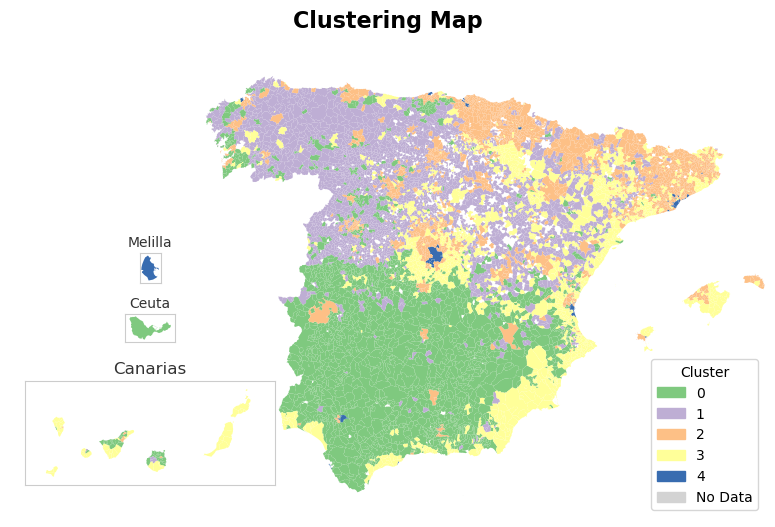

In [5]:
gdf_cluster, metrics, centroids  = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_DENSITY,
        V_MEAN_AGE,
        V_FOREIGN_POPULATION,
        V_HIGHER_EDUCATION,
        V_POPULATION_CHANGE,
        V_MEAN_NET_INCOME,
        V_UNEMPLOYMENT,
        V_AFFILIATION
        ],
    algorithm='kmeans',
    n_clusters=5
    )
cl.plot_cluster_map(gdf_cluster)

Clustering Metrics for kmeans:
  Silhouette Score: 0.29051987359187564
  Davies-Bouldin Index: 1.1094992298751412
  Calinski-Harabasz Index: 3152.303394709307

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)
cluster                                                                                                              
0                           -0.06                        1.07                      -0.14                        -0.27
1                           -0.37                        0.24                      -0.11                         1.65
2                           -1.67                       -0.89                      -1.17                         0.14
3                            0.32                       -0.29                       1.24                        -0.33
4                            1.23                       -0.72                      -0.31  

(<Figure size 1000x600 with 4 Axes>,
 <Axes: title={'center': 'Clustering Map'}>)

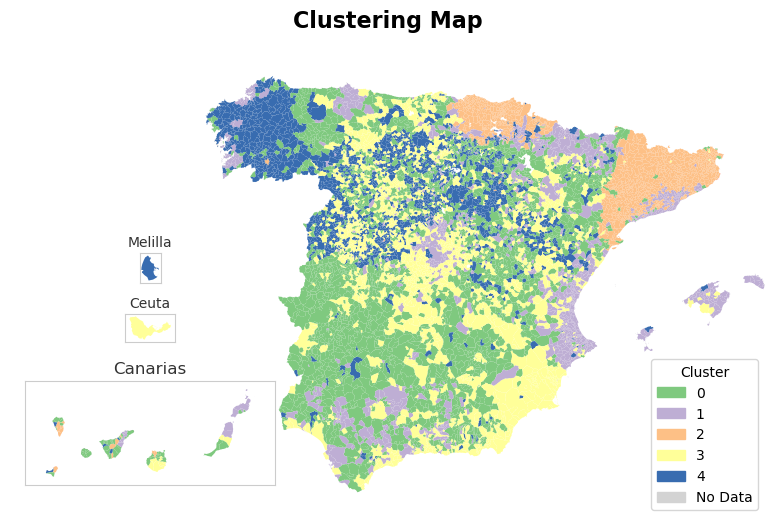

In [6]:
gdf_cluster, metrics, centroids  = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023
        ],
    algorithm='kmeans',
    n_clusters=5
    )
cl.plot_cluster_map(gdf_cluster)

Clustering Metrics for kmeans:
  Silhouette Score: 0.3187777134017006
  Davies-Bouldin Index: 1.0365524659819003
  Calinski-Harabasz Index: 3757.2270989752687

Cluster Centroids (scaled feature space):
         Votes for PP in 2019 (%)  Votes for PSOE in 2019 (%)  Votes for VOX in 2019 (%)  Votes for SUMAR in 2019 (%)
cluster                                                                                                              
0                            0.08                       -0.08                       1.27                        -0.26
1                           -1.46                       -1.36                      -1.31                        -0.11
2                            1.37                       -0.46                      -0.13                        -0.67
3                           -0.39                        0.07                      -0.16                         1.73
4                           -0.11                        1.13                      -0.14  

(<Figure size 1000x600 with 4 Axes>,
 <Axes: title={'center': 'Clustering Map'}>)

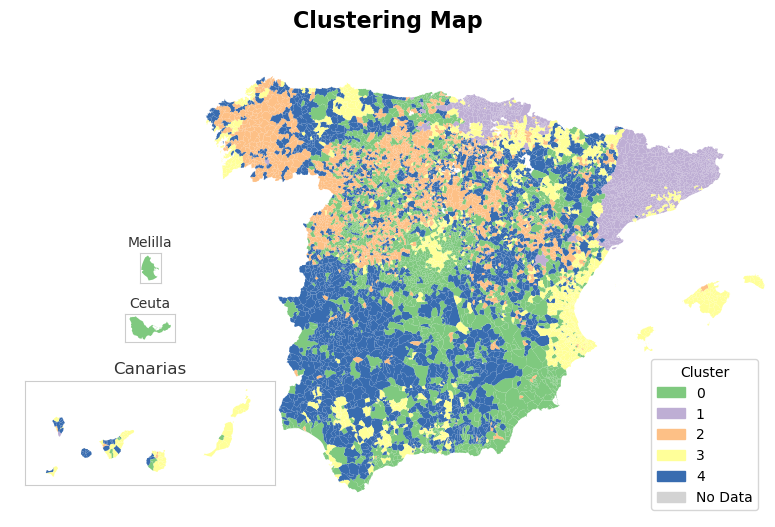

In [7]:
gdf_cluster, metrics, centroids  = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2019,
        V_PSOE_2019,
        V_VOX_2019,
        V_SUMAR_2019
        ],
    algorithm='kmeans',
    n_clusters=5
    )
cl.plot_cluster_map(gdf_cluster)

Early stopping at epoch 151: Label change delta (0.00093) is below tolerance (0.001).
Clustering Metrics for autoencoder:
  Silhouette Score: 0.012160392690278696
  Davies-Bouldin Index: 4.440980882731721
  Calinski-Harabasz Index: 368.2580037548957

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants  Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                        

(<Figure size 1000x600 with 4 Axes>,
 <Axes: title={'center': 'Clustering Map'}>)

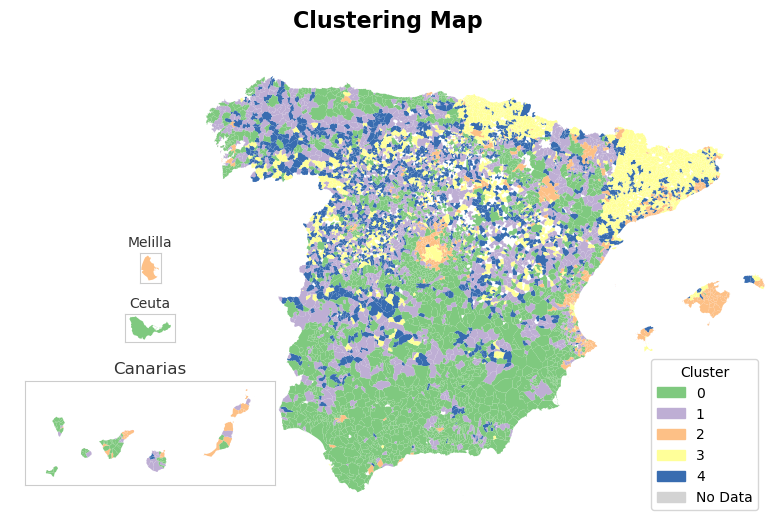

In [8]:
gdf_cluster, metrics, centroids  = cl.perform_clustering(
    gdf = gdf,
    variables= V_CLUSTERING_BASE,
    algorithm='autoencoder',
    n_clusters=5
    )
cl.plot_cluster_map(gdf_cluster)

## Socio-demographic Variables

### K-Means

Clustering Metrics for kmeans:
  Silhouette Score: 0.2184391566333909
  Davies-Bouldin Index: 1.3240513832506826
  Calinski-Harabasz Index: 1561.2309230662186

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants
cluster                                                                                                                                                                                                                                                                                
0                                       -0.10     -0.32                        -0.44                                 -0.66                                    -0.20                       -0.98                               1.17            

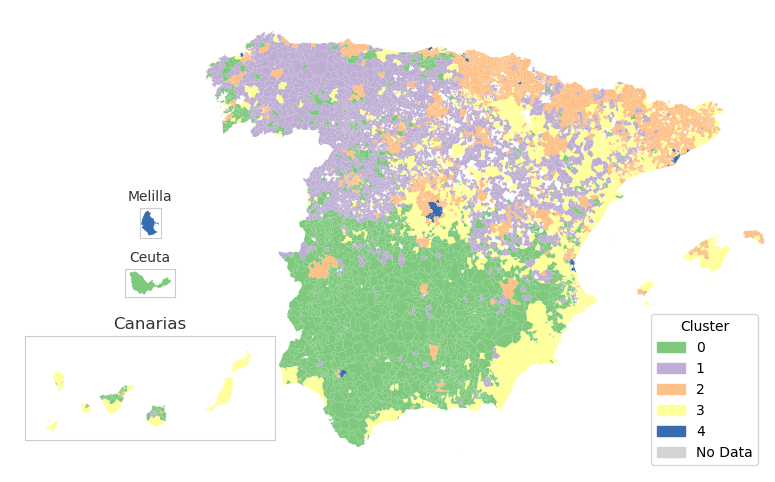

In [9]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_DENSITY,
        V_MEAN_AGE,
        V_FOREIGN_POPULATION,
        V_HIGHER_EDUCATION,
        V_POPULATION_CHANGE,
        V_MEAN_NET_INCOME,
        V_UNEMPLOYMENT,
        V_AFFILIATION
        ],
    algorithm='kmeans',
    n_clusters=5,
    apply_pca=False
    )
fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)

Clustering Metrics for kmeans:
  Silhouette Score: 0.20130411919858984
  Davies-Bouldin Index: 1.356597333933601
  Calinski-Harabasz Index: 1441.6183007106724

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants
cluster                                                                                                                                                                                                                                                                                
0                                       -0.20      1.13                        -0.53                                 -0.39                                    -0.70                        0.16                              -0.53            

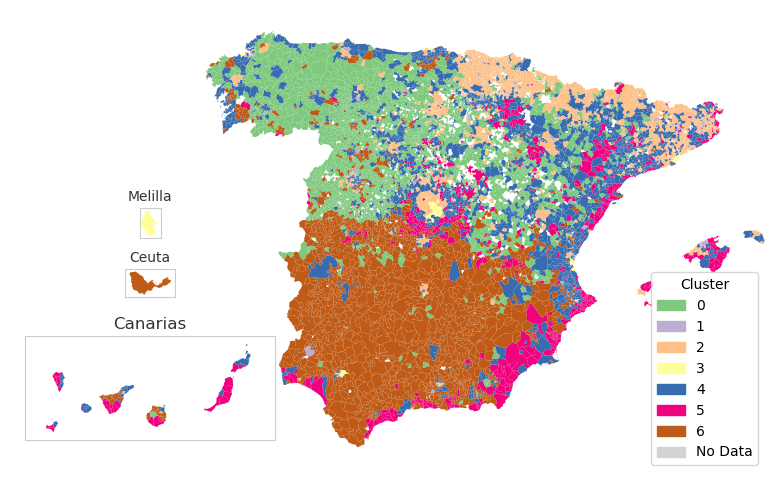

In [10]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_DENSITY,
        V_MEAN_AGE,
        V_FOREIGN_POPULATION,
        V_HIGHER_EDUCATION,
        V_POPULATION_CHANGE,
        V_MEAN_NET_INCOME,
        V_UNEMPLOYMENT,
        V_AFFILIATION
        ],
    algorithm='kmeans',
    n_clusters=7,
    apply_pca=False
    )
fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)

Clustering Metrics for kmeans:
  Silhouette Score: 0.22566983788162642
  Davies-Bouldin Index: 1.2014736284476755
  Calinski-Harabasz Index: 1541.3487364827963

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants
cluster                                                                                                                                                                                                                                                                                
0                                       -0.09     -0.56                         0.05                                  0.73                                     0.09                        0.86                              -0.39           

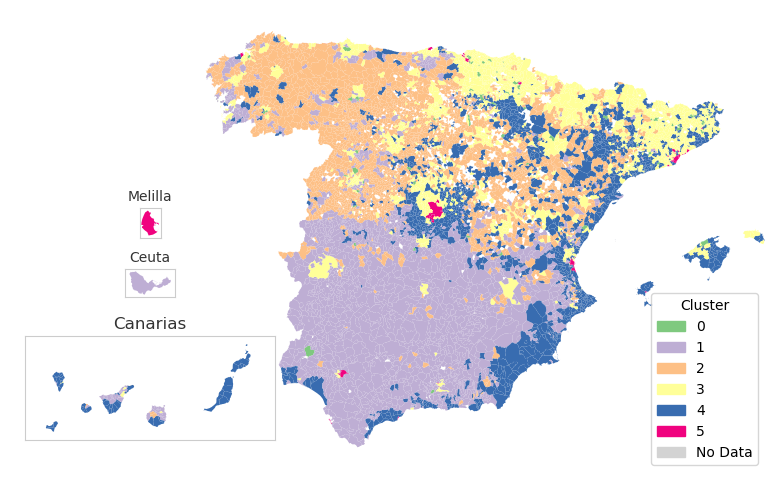

In [11]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_DENSITY,
        V_MEAN_AGE,
        V_FOREIGN_POPULATION,
        V_HIGHER_EDUCATION,
        V_POPULATION_CHANGE,
        V_MEAN_NET_INCOME,
        V_UNEMPLOYMENT,
        V_AFFILIATION
        ],
    algorithm='kmeans',
    n_clusters=6,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)
fig.savefig('03_images/socio-demographic_kmeans.png', bbox_inches='tight', dpi=300)

In [12]:
gdf_cluster[gdf_cluster['cluster'] == 0].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,84.00,31.64,40.63,3.43,12.32,21.77,36.36,321.91
Latitude,84.00,41.75,1.26,37.05,41.09,42.05,42.54,43.45
Longitude,84.00,-1.77,3.05,-8.25,-3.74,-2.23,1.29,2.99
Population in 2023,84.00,"1,739.31","2,566.17",54.00,232.75,853.50,"2,051.25","13,949.00"
Mean age,84.00,46.36,4.24,36.02,43.60,45.69,48.59,58.18
Foreign-born population (%),84.00,10.71,5.44,1.35,7.22,9.97,13.80,28.21
Population density (inhabitants/km2),84.00,107.06,201.96,1.13,8.56,45.37,85.97,995.66
Population with higher education (%),84.00,33.06,8.52,9.80,27.70,32.56,39.03,52.12
Mean net income per person,84.00,"16,639.21","2,341.99","10,953.00","15,290.75","16,401.00","17,737.75","23,159.00"
Population change from 2019 to 2023 (%),84.00,1.90,6.48,-10.98,-2.14,1.18,6.01,26.66


In [13]:
gdf_cluster[gdf_cluster['cluster'] == 1].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"1,777.00",105.15,136.12,0.56,30.26,60.80,125.63,"1,443.34"
Latitude,"1,777.00",38.90,2.21,27.90,37.68,38.91,40.02,43.54
Longitude,"1,777.00",-4.62,2.55,-17.93,-5.96,-4.70,-3.16,1.66
Population in 2023,"1,777.00","6,391.34","23,686.46",47.00,569.00,"1,515.00","4,636.00","587,068.00"
Mean age,"1,777.00",47.85,4.24,36.65,44.74,47.44,50.60,62.52
Foreign-born population (%),"1,777.00",6.69,4.10,0.00,3.49,5.76,9.32,20.72
Population density (inhabitants/km2),"1,777.00",99.17,270.93,1.02,10.23,23.15,66.87,"4,179.42"
Population with higher education (%),"1,777.00",19.96,5.44,5.77,15.92,19.20,23.50,41.52
Mean net income per person,"1,777.00","11,784.06","1,266.32","8,399.00","10,837.00","11,710.00","12,650.00","16,825.00"
Population change from 2019 to 2023 (%),"1,777.00",-0.61,4.81,-32.70,-3.39,-0.91,1.84,30.91


In [14]:
gdf_cluster[gdf_cluster['cluster'] == 2].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"2,485.00",54.89,54.47,0.83,22.23,37.55,66.40,824.61
Latitude,"2,485.00",41.50,1.13,27.97,40.85,41.57,42.27,43.73
Longitude,"2,485.00",-4.10,2.32,-17.23,-5.77,-4.52,-2.38,3.14
Population in 2023,"2,485.00",557.65,"1,204.05",35.00,105.00,201.00,471.00,"20,075.00"
Mean age,"2,485.00",56.34,4.18,44.29,53.26,56.16,59.14,71.86
Foreign-born population (%),"2,485.00",6.35,4.48,0.00,3.08,5.49,8.78,29.79
Population density (inhabitants/km2),"2,485.00",12.23,49.08,0.31,3.27,5.77,11.35,"2,108.67"
Population with higher education (%),"2,485.00",22.70,6.25,3.45,18.25,22.32,26.81,50.00
Mean net income per person,"2,485.00","14,721.17","1,699.29","9,819.00","13,532.00","14,526.00","15,867.00","22,684.00"
Population change from 2019 to 2023 (%),"2,485.00",-4.21,6.91,-36.36,-8.00,-4.05,-0.57,36.36


In [15]:
gdf_cluster[gdf_cluster['cluster'] == 3].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"1,659.00",42.74,76.85,0.39,12.71,24.51,46.20,"1,752.65"
Latitude,"1,659.00",41.86,1.34,28.03,41.37,42.05,42.67,43.64
Longitude,"1,659.00",-1.29,2.88,-17.79,-3.45,-1.71,1.42,4.29
Population in 2023,"1,659.00","6,603.28","27,666.91",48.00,223.00,709.00,"3,570.00","683,949.00"
Mean age,"1,659.00",46.49,4.50,34.91,43.28,45.94,49.26,66.66
Foreign-born population (%),"1,659.00",9.84,4.90,0.00,6.25,9.29,12.88,37.94
Population density (inhabitants/km2),"1,659.00",233.24,558.33,0.60,8.48,30.02,155.84,"4,326.50"
Population with higher education (%),"1,659.00",38.76,7.16,21.14,33.47,38.00,42.90,63.85
Mean net income per person,"1,659.00","17,330.50","2,306.02","12,285.00","15,713.50","16,893.00","18,432.50","30,524.00"
Population change from 2019 to 2023 (%),"1,659.00",5.38,7.75,-19.35,0.70,4.04,8.44,70.37


In [16]:
gdf_cluster[gdf_cluster['cluster'] == 4].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"1,422.00",65.27,95.33,0.08,19.96,38.77,74.52,"1,674.44"
Latitude,"1,422.00",40.00,2.67,27.70,39.25,40.59,41.65,43.66
Longitude,"1,422.00",-1.87,3.56,-18.07,-3.38,-1.34,0.16,4.23
Population in 2023,"1,422.00","9,325.70","27,283.89",53.00,609.50,"2,238.50","7,254.50","467,501.00"
Mean age,"1,422.00",45.53,4.02,34.66,42.67,45.03,48.06,59.96
Foreign-born population (%),"1,422.00",21.69,9.44,4.57,15.66,19.44,24.86,73.31
Population density (inhabitants/km2),"1,422.00",240.95,536.21,0.97,16.19,54.50,173.79,"4,324.47"
Population with higher education (%),"1,422.00",24.55,6.10,4.35,20.32,24.61,28.74,52.50
Mean net income per person,"1,422.00","13,334.22","1,618.30","6,958.00","12,285.00","13,414.00","14,439.00","19,124.00"
Population change from 2019 to 2023 (%),"1,422.00",7.74,9.88,-21.11,2.12,5.48,10.68,100.00


In [17]:
gdf_cluster[gdf_cluster['cluster'] == 5].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,62.00,26.49,79.80,0.01,3.39,6.15,19.20,604.47
Latitude,62.00,40.57,2.04,35.29,39.43,41.36,41.55,43.46
Longitude,62.00,-1.21,2.97,-8.42,-3.63,-0.45,2.07,2.78
Population in 2023,62.00,"176,214.15","475,587.70",125.00,"24,384.00","42,967.50","132,034.75","3,340,176.00"
Mean age,62.00,43.82,2.50,36.85,42.52,43.95,45.11,49.52
Foreign-born population (%),62.00,18.17,8.18,4.13,13.32,17.42,21.71,44.21
Population density (inhabitants/km2),62.00,"8,587.62","4,814.91","4,417.30","5,239.18","6,403.80","9,918.06","25,250.26"
Population with higher education (%),62.00,33.61,8.92,16.28,27.14,31.24,39.01,59.20
Mean net income per person,62.00,"15,243.76","2,568.98","10,843.00","13,329.75","15,118.00","16,793.00","24,626.00"
Population change from 2019 to 2023 (%),62.00,1.52,2.66,-3.63,0.07,1.37,2.98,9.26


### Spectral Clustering

Clustering Metrics for spectral:
  Silhouette Score: 0.14045080330033255
  Davies-Bouldin Index: 1.2599599195520745
  Calinski-Harabasz Index: 1253.7571246785974

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants
cluster                                                                                                                                                                                                                                                                                
0                                       -0.19      0.99                        -0.49                                 -0.37                                    -0.60                        0.09                              -0.44         

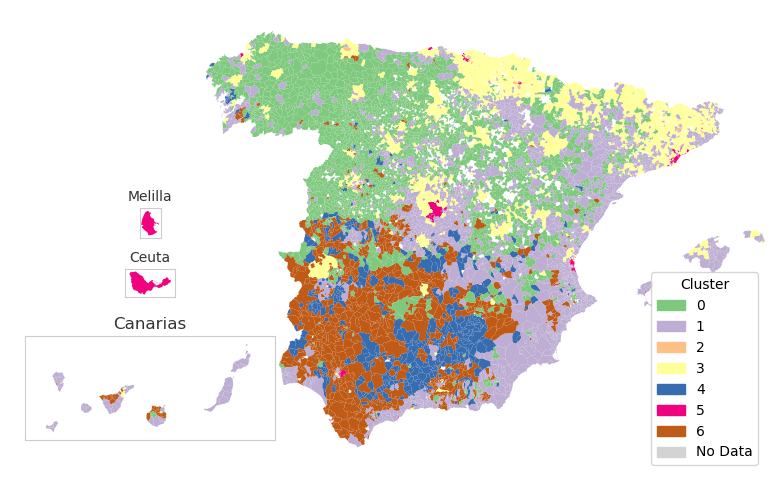

In [18]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_DENSITY,
        V_MEAN_AGE,
        V_FOREIGN_POPULATION,
        V_HIGHER_EDUCATION,
        V_POPULATION_CHANGE,
        V_MEAN_NET_INCOME,
        V_UNEMPLOYMENT,
        V_AFFILIATION
        ],
    algorithm='spectral',
    n_clusters=7,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)

Clustering Metrics for spectral:
  Silhouette Score: 0.2155723423224182
  Davies-Bouldin Index: 1.2231214306255864
  Calinski-Harabasz Index: 1466.0503853349535

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants
cluster                                                                                                                                                                                                                                                                                
0                                       -0.19      0.99                        -0.48                                 -0.36                                    -0.60                        0.10                              -0.46          

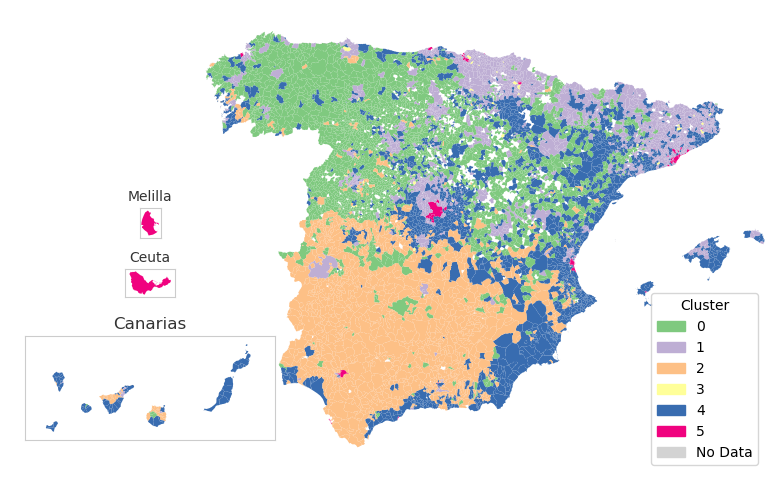

In [19]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_DENSITY,
        V_MEAN_AGE,
        V_FOREIGN_POPULATION,
        V_HIGHER_EDUCATION,
        V_POPULATION_CHANGE,
        V_MEAN_NET_INCOME,
        V_UNEMPLOYMENT,
        V_AFFILIATION
        ],
    algorithm='spectral',
    n_clusters=6,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)
fig.savefig('03_images/socio-demographic_spectral.png', bbox_inches='tight', dpi=300)

In [20]:
gdf_cluster[gdf_cluster['cluster'] == 3].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,43.00,20.87,17.63,3.43,10.46,15.85,24.75,106.75
Latitude,43.00,41.91,1.08,39.30,41.09,42.02,42.72,43.45
Longitude,43.00,-1.80,2.91,-5.89,-3.97,-2.28,0.40,2.99
Population in 2023,43.00,"1,647.79","2,634.47",54.00,229.00,771.00,"1,984.00","13,949.00"
Mean age,43.00,45.97,4.20,36.02,43.30,45.24,48.39,55.58
Foreign-born population (%),43.00,10.20,4.69,1.59,7.44,8.63,13.32,20.96
Population density (inhabitants/km2),43.00,104.79,175.19,1.83,14.39,54.93,127.91,834.36
Population with higher education (%),43.00,34.26,8.81,9.80,28.27,35.35,40.83,52.12
Mean net income per person,43.00,"17,081.58","2,345.71","13,140.00","15,363.00","16,716.00","18,416.00","23,159.00"
Population change from 2019 to 2023 (%),43.00,2.26,7.01,-10.98,-1.56,0.77,4.81,26.66


### Hierarchical Clustering

Clustering Metrics for hierarchical:
  Silhouette Score: 0.16127022961569762
  Davies-Bouldin Index: 1.380651543594613
  Calinski-Harabasz Index: 1113.2578717089398

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants
cluster                                                                                                                                                                                                                                                                                
0                                       -0.18      0.75                        -0.46                                 -0.15                                    -0.52                        0.17                              -0.40      

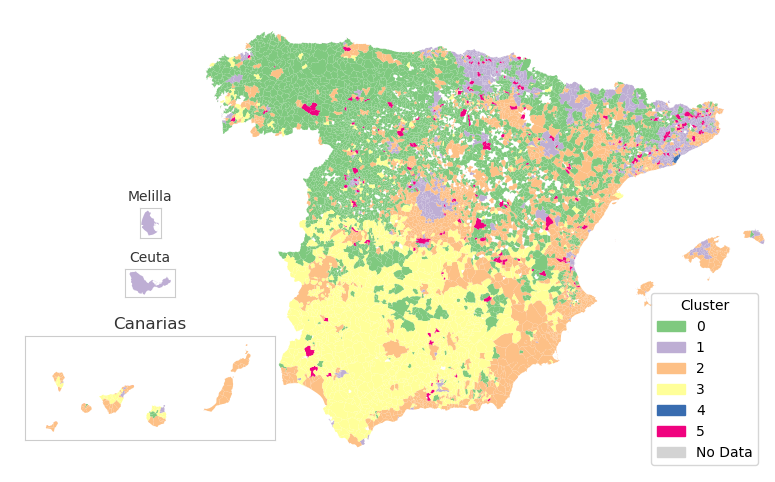

In [21]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_DENSITY,
        V_MEAN_AGE,
        V_FOREIGN_POPULATION,
        V_HIGHER_EDUCATION,
        V_POPULATION_CHANGE,
        V_MEAN_NET_INCOME,
        V_UNEMPLOYMENT,
        V_AFFILIATION
        ],
    algorithm='hierarchical',
    n_clusters=6,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)
fig.savefig('03_images/socio-demographic_hierarchical.png', bbox_inches='tight', dpi=300)

In [22]:
gdf_cluster[gdf_cluster['cluster'] == 4].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,20.00,9.02,22.27,0.01,1.03,2.62,5.14,101.14
Latitude,20.00,41.15,1.27,39.42,39.54,41.41,41.50,43.32
Longitude,20.00,0.57,1.76,-3.02,-0.41,0.87,2.15,2.36
Population in 2023,20.00,"136,950.20","364,861.35",125.00,"15,180.50","38,547.50","57,745.00","1,655,956.00"
Mean age,20.00,44.00,1.99,39.67,43.19,43.95,44.74,49.52
Foreign-born population (%),20.00,20.02,6.91,9.31,16.35,20.05,22.99,36.18
Population density (inhabitants/km2),20.00,"14,191.88","4,728.55","8,867.95","10,235.01","13,485.31","16,463.44","25,250.26"
Population with higher education (%),20.00,31.82,7.55,16.28,26.83,29.96,38.03,48.35
Mean net income per person,20.00,"14,806.95","2,074.47","12,111.00","13,263.75","14,519.00","16,619.75","19,527.00"
Population change from 2019 to 2023 (%),20.00,2.30,3.18,-3.09,0.54,2.27,4.38,9.26


In [23]:
gdf_cluster[gdf_cluster['cluster'] == 5].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,211.00,41.88,52.32,0.63,13.49,25.03,49.76,377.27
Latitude,211.00,41.28,1.49,36.89,40.52,41.68,42.29,43.45
Longitude,211.00,-1.87,2.95,-8.63,-3.95,-2.15,0.70,3.17
Population in 2023,211.00,"2,952.75","7,014.36",49.00,312.00,"1,113.00","2,603.50","85,818.00"
Mean age,211.00,46.60,5.30,36.02,43.00,45.44,49.10,67.73
Foreign-born population (%),211.00,10.61,4.90,0.00,7.03,10.26,13.71,28.21
Population density (inhabitants/km2),211.00,135.97,236.88,1.13,8.73,46.47,133.53,"1,299.90"
Population with higher education (%),211.00,29.59,8.67,9.80,23.66,28.95,35.86,52.12
Mean net income per person,211.00,"15,380.96","2,362.80","8,606.00","13,947.00","15,684.00","16,733.00","23,159.00"
Population change from 2019 to 2023 (%),211.00,0.75,6.80,-36.36,-1.74,1.46,4.00,26.66


### DBSCAN

Clustering Metrics for dbscan:
  Silhouette Score: -0.3117952848185653
  Davies-Bouldin Index: 1.0857280747871767
  Calinski-Harabasz Index: 13.92257412086154

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants
cluster                                                                                                                                                                                                                                                                                
0                                       -0.15      0.09                        -0.35                                 -0.42                                    -0.31                       -0.43                               0.15            

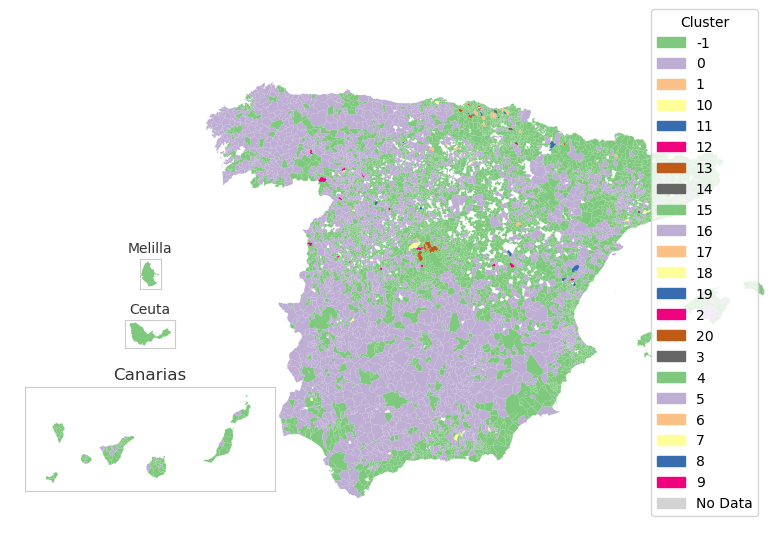

In [24]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_DENSITY,
        V_MEAN_AGE,
        V_FOREIGN_POPULATION,
        V_HIGHER_EDUCATION,
        V_POPULATION_CHANGE,
        V_MEAN_NET_INCOME,
        V_UNEMPLOYMENT,
        V_AFFILIATION
        ],
    algorithm='dbscan',
    eps=0.6,
    min_samples=5,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)
fig.savefig('03_images/socio-demographic_dbscan.png', bbox_inches='tight', dpi=300)

### Gaussian Mixture Models

Clustering Metrics for gaussian:
  Silhouette Score: 0.05164871455212399
  Davies-Bouldin Index: 2.2748269792944926
  Calinski-Harabasz Index: 637.4253413741898

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants
cluster                                                                                                                                                                                                                                                                                
0                                       -0.13     -0.75                         0.69                                  0.20                                     0.44                       -0.13                               0.10          

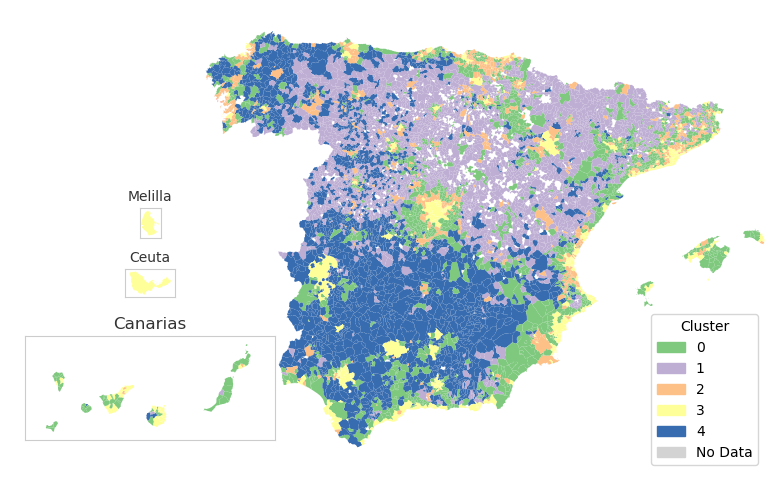

In [25]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_DENSITY,
        V_MEAN_AGE,
        V_FOREIGN_POPULATION,
        V_HIGHER_EDUCATION,
        V_POPULATION_CHANGE,
        V_MEAN_NET_INCOME,
        V_UNEMPLOYMENT,
        V_AFFILIATION
        ],
    algorithm='gaussian',
    n_clusters=5,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)

Clustering Metrics for gaussian:
  Silhouette Score: 0.0545260166251642
  Davies-Bouldin Index: 2.7016600699116737
  Calinski-Harabasz Index: 603.7873229240724

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants
cluster                                                                                                                                                                                                                                                                                
0                                       -0.19     -0.14                         0.50                                  0.33                                     0.64                        0.41                              -0.27           

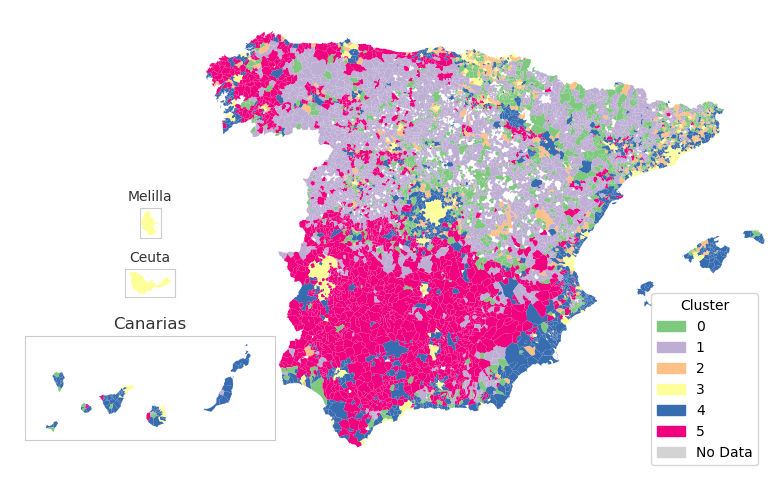

In [26]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_DENSITY,
        V_MEAN_AGE,
        V_FOREIGN_POPULATION,
        V_HIGHER_EDUCATION,
        V_POPULATION_CHANGE,
        V_MEAN_NET_INCOME,
        V_UNEMPLOYMENT,
        V_AFFILIATION
        ],
    algorithm='gaussian',
    n_clusters=6,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)
fig.savefig('03_images/socio-demographic_gaussian.png', bbox_inches='tight', dpi=300)

In [27]:
gdf_cluster[gdf_cluster['cluster'] == 0].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"1,211.00",49.13,64.22,2.29,16.54,29.42,56.16,861.06
Latitude,"1,211.00",41.20,1.70,27.70,40.60,41.48,42.33,43.52
Longitude,"1,211.00",-2.12,2.71,-18.03,-3.74,-2.23,-0.34,4.11
Population in 2023,"1,211.00",804.26,"1,555.15",35.00,168.00,364.00,806.50,"25,751.00"
Mean age,"1,211.00",49.00,5.03,35.16,45.56,48.31,51.91,67.73
Foreign-born population (%),"1,211.00",14.39,9.00,0.00,7.06,13.46,19.98,73.31
Population density (inhabitants/km2),"1,211.00",17.66,12.42,0.31,6.77,16.61,25.01,102.43
Population with higher education (%),"1,211.00",29.26,10.88,4.35,20.66,28.18,36.92,62.77
Mean net income per person,"1,211.00","15,450.47","3,096.73","6,958.00","13,268.00","15,297.00","16,964.00","30,242.00"
Population change from 2019 to 2023 (%),"1,211.00",6.75,13.64,-36.36,-1.32,4.57,12.47,100.00


### DEC

Early stopping at epoch 161: Label change delta (0.00093) is below tolerance (0.001).
Clustering Metrics for autoencoder:
  Silhouette Score: 0.025092591332466403
  Davies-Bouldin Index: 3.948629666974389
  Calinski-Harabasz Index: 601.7410939044646

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants
cluster                                                                                                                                                                                                                                                                                
0                                       -0.19      0.66                        -0.40                                 -0.30                         

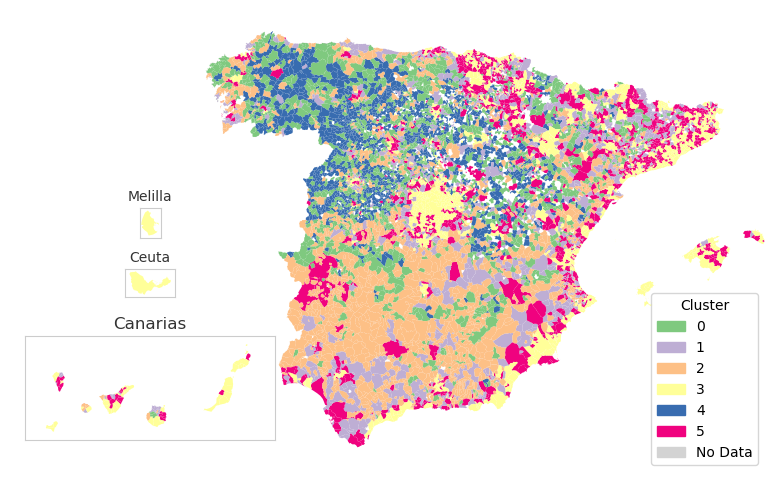

In [28]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_DENSITY,
        V_MEAN_AGE,
        V_FOREIGN_POPULATION,
        V_HIGHER_EDUCATION,
        V_POPULATION_CHANGE,
        V_MEAN_NET_INCOME,
        V_UNEMPLOYMENT,
        V_AFFILIATION
        ],
    algorithm='autoencoder',
    n_clusters=6,
    embedding_dim=3,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)
fig.savefig('03_images/socio-demographic_autoencoder.png', bbox_inches='tight', dpi=300)

## Electoral variables

### K-Means

Clustering Metrics for kmeans:
  Silhouette Score: 0.16926067632393993
  Davies-Bouldin Index: 1.6711572360872573
  Calinski-Harabasz Index: 1340.0908749074433

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                            0.74                       -0.36                       0.29                        -0.33                                      0.80                                       -0.35          

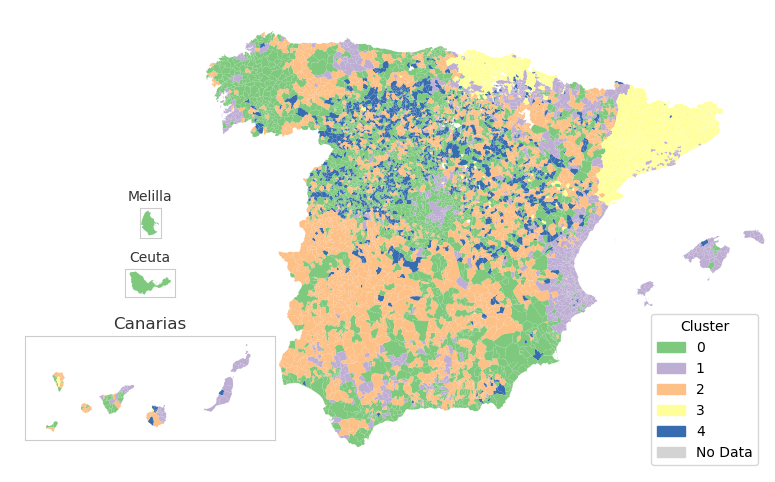

In [29]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='kmeans',
    n_clusters=5,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)

Clustering Metrics for kmeans:
  Silhouette Score: 0.17328619074904872
  Davies-Bouldin Index: 1.5829223630883174
  Calinski-Harabasz Index: 1171.074653732599

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                            0.48                       -0.53                       1.25                        -0.64                                     -1.05                                       -0.32           

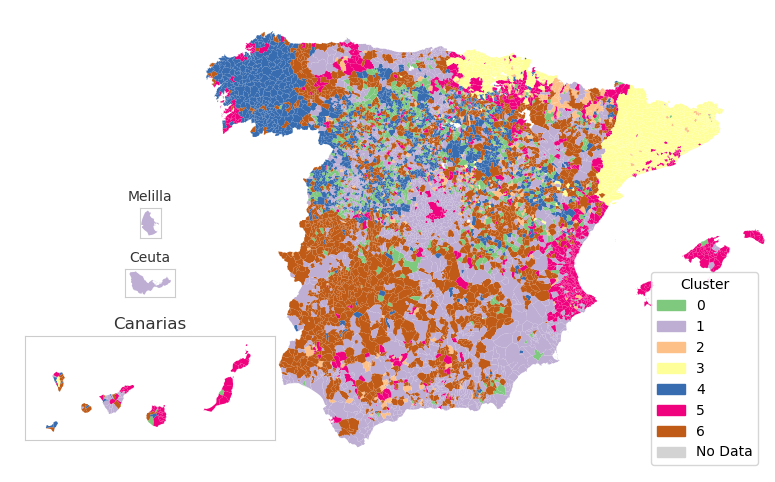

In [30]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='kmeans',
    n_clusters=7,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)
fig.savefig('03_images/electoral_kmeans.png', bbox_inches='tight', dpi=300)

Clustering Metrics for kmeans:
  Silhouette Score: 0.16664026342749652
  Davies-Bouldin Index: 1.5624079340149213
  Calinski-Harabasz Index: 1097.2300437316908

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                           -1.69                       -0.78                      -1.10                         0.14                                     -0.77                                        1.31          

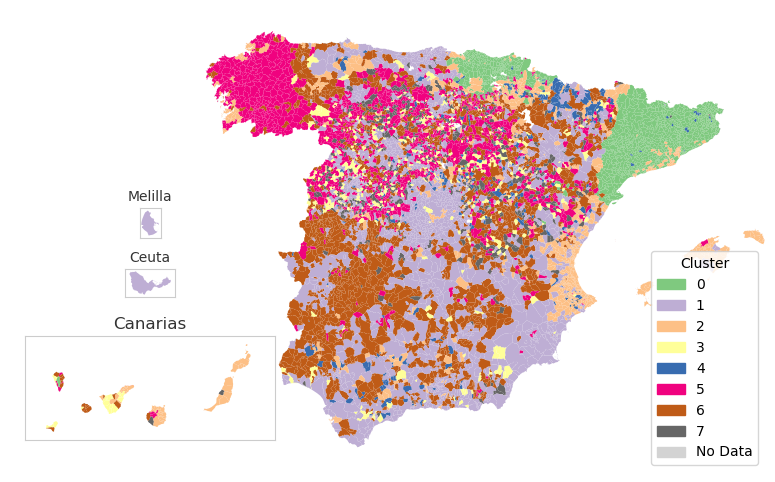

In [31]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='kmeans',
    n_clusters=8,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)

Clustering Metrics for kmeans:
  Silhouette Score: 0.17048677370598447
  Davies-Bouldin Index: 1.6770338811143881
  Calinski-Harabasz Index: 1238.7805956418763

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                            0.46                       -0.52                       1.19                        -0.57                                     -1.06                                       -0.34          

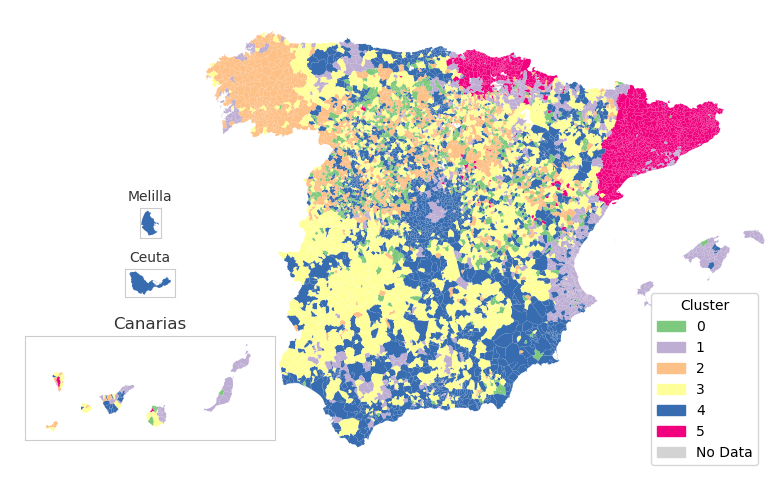

In [32]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='kmeans',
    n_clusters=6,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)
fig.savefig('03_images/electoral_kmeans_6.png', bbox_inches='tight', dpi=300)

In [33]:
gdf_cluster[gdf_cluster['cluster'] == 0].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,834.00,39.17,37.31,1.61,18.04,28.17,46.43,355.93
Latitude,834.00,41.10,1.51,27.86,40.54,41.21,42.07,43.26
Longitude,834.00,-3.69,2.01,-15.72,-5.04,-3.94,-2.27,3.00
Population in 2023,834.00,358.82,"1,520.22",8.00,63.25,119.50,249.50,"24,728.00"
Mean age,834.00,55.16,5.63,35.36,51.55,55.44,58.81,70.21
Foreign-born population (%),834.00,7.71,7.47,0.00,2.86,5.75,10.32,71.51
Population density (inhabitants/km2),834.00,9.43,25.36,0.30,2.29,4.31,8.04,380.81
Population with higher education (%),685.00,23.55,8.09,3.45,17.83,22.50,27.91,58.19
Mean net income per person,821.00,"14,988.00","2,106.39","6,958.00","13,590.00","14,997.00","16,355.00","24,947.00"
Population change from 2019 to 2023 (%),834.00,0.63,13.17,-35.12,-7.56,-1.36,5.82,92.65


In [34]:
gdf_cluster[gdf_cluster['cluster'] == 1].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"1,057.00",50.25,63.03,0.03,13.26,28.94,60.63,604.47
Latitude,"1,057.00",40.07,2.71,27.87,38.95,40.10,42.13,43.64
Longitude,"1,057.00",-2.09,3.50,-17.93,-3.58,-0.91,-0.27,4.29
Population in 2023,"1,057.00","16,098.76","110,699.50",8.00,321.00,"1,891.00","9,230.00","3,340,176.00"
Mean age,"1,057.00",47.29,5.18,34.91,43.62,45.94,50.21,67.18
Foreign-born population (%),"1,057.00",12.88,9.38,0.00,6.49,11.25,16.16,64.64
Population density (inhabitants/km2),"1,057.00",654.74,"2,113.25",0.49,12.24,60.93,339.23,"25,250.26"
Population with higher education (%),"1,003.00",29.02,8.23,4.26,23.43,28.13,34.18,62.77
Mean net income per person,"1,049.00","14,599.44","2,555.17","8,428.00","12,894.00","14,354.00","15,959.00","30,242.00"
Population change from 2019 to 2023 (%),"1,057.00",3.56,8.62,-38.46,-0.58,2.70,6.99,70.37


In [35]:
gdf_cluster[gdf_cluster['cluster'] == 2].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"1,322.00",52.17,51.48,1.26,19.12,34.12,66.10,406.37
Latitude,"1,322.00",41.55,1.60,27.75,40.99,41.80,42.38,43.68
Longitude,"1,322.00",-4.79,2.54,-18.07,-6.27,-4.80,-2.86,0.70
Population in 2023,"1,322.00","1,260.25","4,803.01",3.00,78.00,182.00,658.75,"98,716.00"
Mean age,"1,322.00",56.19,5.48,40.03,52.59,56.25,59.68,75.12
Foreign-born population (%),"1,322.00",7.47,6.68,0.00,2.87,5.79,10.24,55.56
Population density (inhabitants/km2),"1,322.00",22.31,69.18,0.25,3.03,5.85,14.79,"1,232.94"
Population with higher education (%),"1,150.00",23.42,7.61,4.55,18.08,22.12,27.90,60.86
Mean net income per person,"1,314.00","14,849.78","2,056.76","9,365.00","13,391.50","14,584.00","16,182.25","28,682.00"
Population change from 2019 to 2023 (%),"1,322.00",-2.15,11.61,-41.67,-7.36,-3.07,1.67,150.00


In [36]:
gdf_cluster[gdf_cluster['cluster'] == 3].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"1,910.00",82.99,100.35,0.56,26.34,50.21,99.62,"1,207.44"
Latitude,"1,910.00",40.17,2.14,27.70,38.89,40.33,41.85,43.73
Longitude,"1,910.00",-4.09,2.46,-18.03,-5.81,-4.16,-2.33,0.71
Population in 2023,"1,910.00","2,256.08","10,505.47",8.00,226.25,587.00,"1,591.00","297,129.00"
Mean age,"1,910.00",51.57,5.55,38.33,47.23,51.33,55.26,73.91
Foreign-born population (%),"1,910.00",7.96,6.78,0.00,3.24,5.91,10.74,43.96
Population density (inhabitants/km2),"1,910.00",42.18,219.01,0.31,4.88,10.88,24.84,"5,563.71"
Population with higher education (%),"1,827.00",21.21,6.62,5.10,16.49,20.22,24.88,53.06
Mean net income per person,"1,897.00","13,185.81","2,214.23","8,399.00","11,428.00","12,926.00","14,740.00","21,188.00"
Population change from 2019 to 2023 (%),"1,910.00",-0.75,8.67,-36.36,-4.91,-1.67,2.02,59.46


In [37]:
gdf_cluster[gdf_cluster['cluster'] == 4].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"1,766.00",84.96,142.55,0.01,21.45,41.50,85.77,"1,752.65"
Latitude,"1,766.00",39.98,2.20,28.06,38.39,40.43,41.46,43.60
Longitude,"1,766.00",-3.69,2.20,-17.97,-4.88,-3.76,-2.41,3.15
Population in 2023,"1,766.00","9,766.24","37,773.65",6.00,265.00,"1,306.00","6,071.75","684,164.00"
Mean age,"1,766.00",47.81,6.41,34.66,42.85,46.73,52.54,70.20
Foreign-born population (%),"1,766.00",11.86,9.65,0.00,5.24,9.41,15.96,73.31
Population density (inhabitants/km2),"1,766.00",185.78,611.25,0.23,7.06,25.26,110.78,"9,938.42"
Population with higher education (%),"1,692.00",25.78,9.28,4.76,18.66,24.06,31.42,63.85
Mean net income per person,"1,753.00","13,719.50","2,468.57","8,606.00","11,742.00","13,537.00","15,351.00","30,524.00"
Population change from 2019 to 2023 (%),"1,766.00",3.03,10.17,-40.00,-2.48,2.08,7.55,100.00


In [38]:
gdf_cluster[gdf_cluster['cluster'] == 5].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"1,242.00",33.79,34.95,0.65,11.97,22.99,42.75,370.83
Latitude,"1,242.00",42.06,0.90,28.07,41.54,41.99,42.67,43.42
Longitude,"1,242.00",0.53,2.11,-17.87,-1.67,1.15,2.11,3.27
Population in 2023,"1,242.00","6,076.79","50,119.51",8.00,282.25,813.00,"3,092.25","1,655,956.00"
Mean age,"1,242.00",46.31,4.25,35.16,43.33,45.55,48.26,70.17
Foreign-born population (%),"1,242.00",12.02,7.05,0.00,7.24,10.99,15.31,50.00
Population density (inhabitants/km2),"1,242.00",276.53,965.75,0.37,11.41,39.82,148.81,"16,372.21"
Population with higher education (%),"1,206.00",35.98,8.90,10.75,29.42,35.39,41.76,62.95
Mean net income per person,"1,224.00","16,831.13","2,626.30","10,843.00","15,014.50","16,515.50","18,358.00","28,987.00"
Population change from 2019 to 2023 (%),"1,242.00",3.43,7.01,-25.00,-0.23,2.86,6.58,68.75


### Spectral Clustering

Clustering Metrics for spectral:
  Silhouette Score: 0.10416538603915611
  Davies-Bouldin Index: 1.666507634751236
  Calinski-Harabasz Index: 807.8567707650795

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                            0.26                        0.34                      -0.04                        -0.26                                     -0.26                                       -0.31          

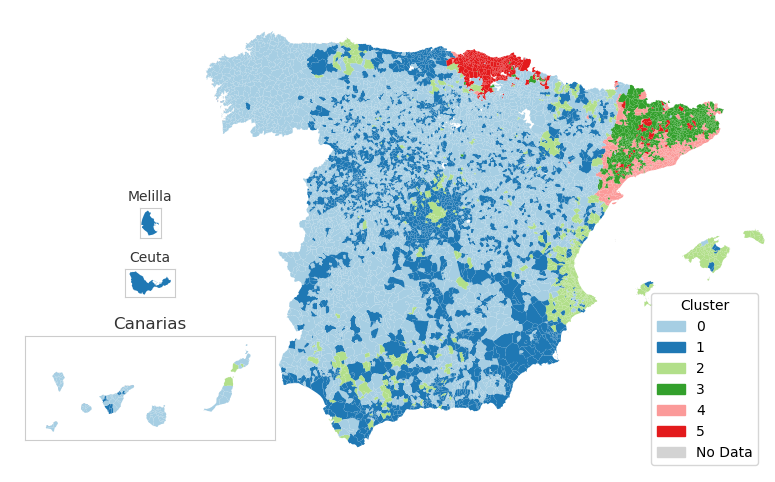

In [39]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='spectral',
    n_clusters=6,
    apply_pca=False
    )

# We move the leyend a bit to the right to avoid overlapping with the clusters
fig, ax = cl.plot_cluster_map(gdf_cluster, title=None, cmap='Paired')

Clustering Metrics for spectral:
  Silhouette Score: 0.08074118758854226
  Davies-Bouldin Index: 1.6219003111382722
  Calinski-Harabasz Index: 691.4675186617666

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                            0.42                        0.09                       0.44                        -0.10                                      1.27                                        1.29         

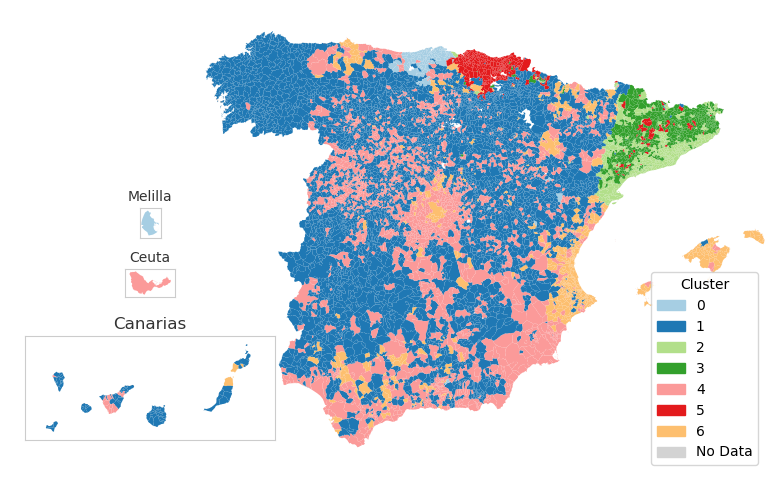

In [40]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='spectral',
    n_clusters=7,
    apply_pca=False
    )

# We move the leyend a bit to the right to avoid overlapping with the clusters
fig, ax = cl.plot_cluster_map(gdf_cluster, title=None, cmap='Paired')

fig.savefig('03_images/electoral_spectral.png', bbox_inches='tight', dpi=300)

Clustering Metrics for spectral:
  Silhouette Score: 0.0856626609698503
  Davies-Bouldin Index: 1.6781095216532385
  Calinski-Harabasz Index: 714.9954600863244

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                           -0.08                        0.95                       0.05                        -0.15                                     -0.16                                       -0.27          

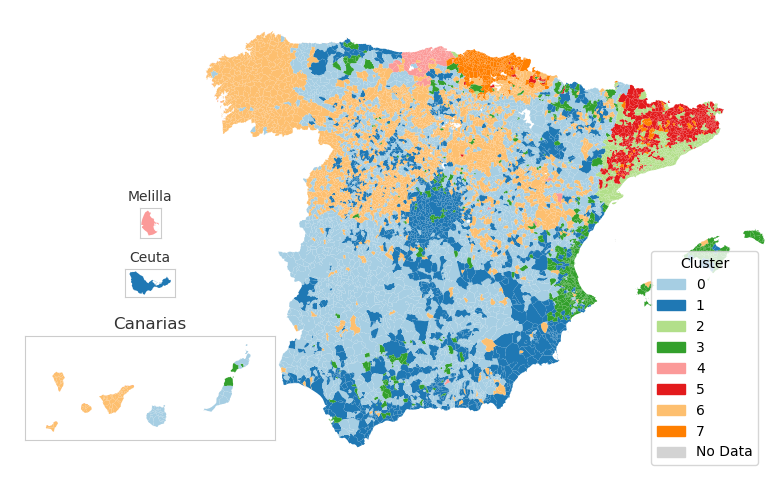

In [41]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='spectral',
    n_clusters=8,
    apply_pca=False
    )

# We move the leyend a bit to the right to avoid overlapping with the clusters
fig, ax = cl.plot_cluster_map(gdf_cluster, title=None, cmap='Paired')

Clustering Metrics for spectral:
  Silhouette Score: 0.11022016881439496
  Davies-Bouldin Index: 1.6001591953391958
  Calinski-Harabasz Index: 752.4226773736186

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                            0.33                       -0.16                       0.87                         0.05                                      0.92                                       -0.26         

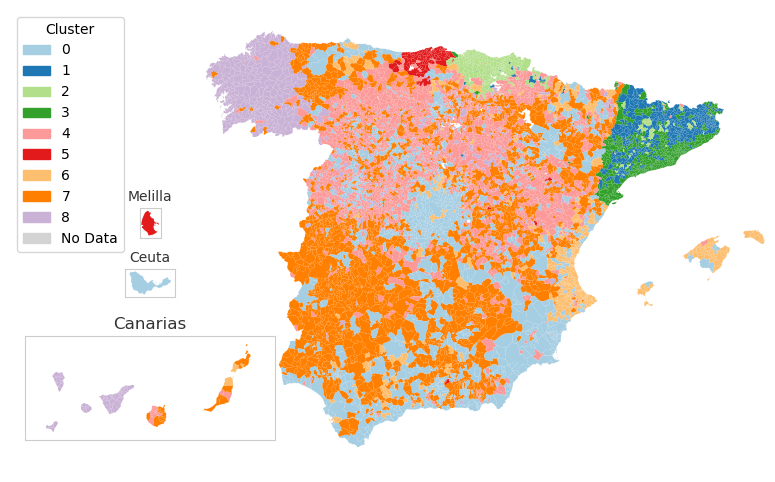

In [42]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='spectral',
    n_clusters=9,
    apply_pca=False
    )

# We move the leyend a bit to the right to avoid overlapping with the clusters
fig, ax = cl.plot_cluster_map(gdf_cluster, title=None, cmap='Paired')

# Capturamos la leyenda que ya existe en el eje (ax)
leyenda = ax.get_legend()

# Si la leyenda existe, le cambiamos la posición
if leyenda is not None:
    leyenda.set_bbox_to_anchor((0, 1))
    leyenda._loc = 2 

fig.savefig('03_images/electoral_spectral_9.png', bbox_inches='tight', dpi=300)

### Hierarchical Clustering

Clustering Metrics for hierarchical:
  Silhouette Score: 0.11377347813078517
  Davies-Bouldin Index: 1.9379108166272643
  Calinski-Harabasz Index: 903.7977263875324

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                           -0.10                        0.26                      -0.21                         1.42                                      0.04                                       -0.21     

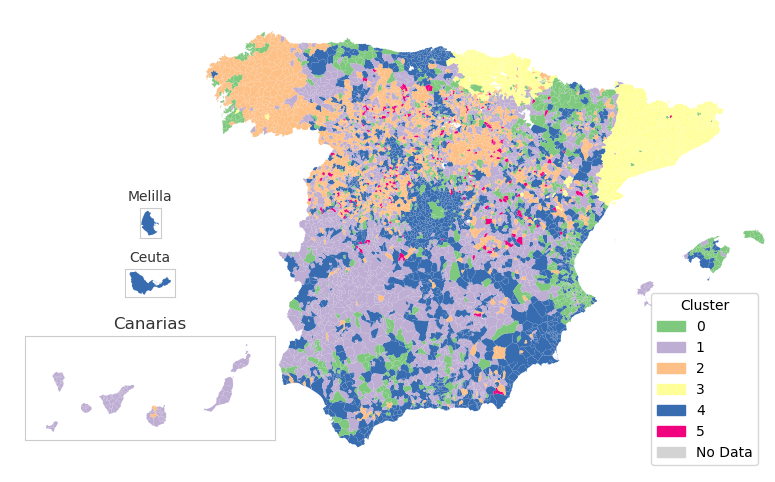

In [43]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='hierarchical',
    n_clusters=6,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)

Clustering Metrics for hierarchical:
  Silhouette Score: 0.11534600619362922
  Davies-Bouldin Index: 1.8396795022322008
  Calinski-Harabasz Index: 844.7480676408671

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                            1.10                       -0.72                       0.01                        -0.68                                      0.19                                       -0.53     

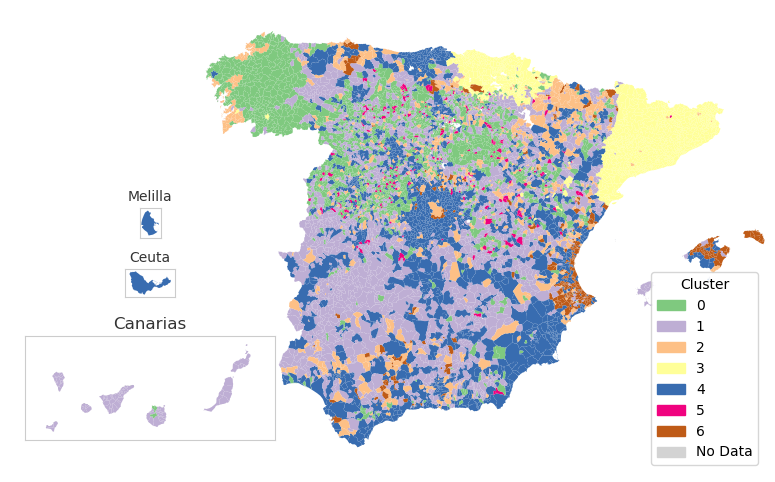

In [44]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='hierarchical',
    n_clusters=7,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)
fig.savefig('03_images/electoral_hierarchical.png', bbox_inches='tight', dpi=300)

In [45]:
gdf_cluster[gdf_cluster['cluster'] == 0].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"1,583.00",53.05,52.45,0.01,20.11,35.05,65.85,441.03
Latitude,"1,583.00",41.50,1.31,27.97,40.89,41.72,42.35,43.68
Longitude,"1,583.00",-4.58,2.23,-15.66,-5.98,-4.77,-2.85,0.61
Population in 2023,"1,583.00","1,269.93","5,911.53",4.00,87.00,197.00,639.00,"150,206.00"
Mean age,"1,583.00",55.58,5.58,36.35,51.84,55.70,59.20,75.12
Foreign-born population (%),"1,583.00",7.71,6.93,0.00,3.04,5.90,10.44,64.64
Population density (inhabitants/km2),"1,583.00",27.44,261.32,0.23,3.13,5.96,14.45,"9,938.42"
Population with higher education (%),"1,403.00",22.94,7.23,4.76,17.86,21.80,27.05,58.19
Mean net income per person,"1,572.00","14,691.74","2,015.32","8,606.00","13,328.00","14,437.00","15,959.00","28,682.00"
Population change from 2019 to 2023 (%),"1,583.00",-1.58,11.47,-40.00,-7.20,-2.74,2.36,150.00


In [46]:
gdf_cluster[gdf_cluster['cluster'] == 1].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"2,351.00",72.76,89.13,0.08,23.59,44.24,84.67,"1,207.44"
Latitude,"2,351.00",39.92,2.79,27.70,38.89,40.47,41.78,43.64
Longitude,"2,351.00",-4.24,3.08,-18.07,-5.71,-3.98,-2.29,3.31
Population in 2023,"2,351.00","2,350.98","11,795.18",3.00,136.50,433.00,"1,346.00","380,863.00"
Mean age,"2,351.00",52.07,5.87,38.33,47.46,51.79,56.30,73.91
Foreign-born population (%),"2,351.00",8.57,8.02,0.00,3.16,6.09,11.38,71.51
Population density (inhabitants/km2),"2,351.00",44.65,274.72,0.30,3.92,9.31,22.04,"9,098.72"
Population with higher education (%),"2,168.00",21.61,7.11,3.45,16.58,20.48,25.55,52.89
Mean net income per person,"2,331.00","13,505.67","2,402.68","6,958.00","11,609.00","13,281.00","15,327.50","23,329.00"
Population change from 2019 to 2023 (%),"2,351.00",-0.48,9.83,-38.46,-5.32,-1.59,2.83,70.37


In [47]:
gdf_cluster[gdf_cluster['cluster'] == 2].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,776.00,64.95,94.49,0.03,18.15,33.42,75.59,973.93
Latitude,776.00,40.83,1.80,36.28,39.89,41.17,42.20,43.73
Longitude,776.00,-3.40,2.48,-9.20,-5.21,-3.45,-1.23,3.13
Population in 2023,776.00,"9,509.81","123,837.87",6.00,103.75,298.50,"1,986.25","3,340,176.00"
Mean age,776.00,51.33,6.11,39.27,46.33,50.76,55.78,69.37
Foreign-born population (%),776.00,8.61,6.97,0.00,3.85,7.19,11.59,55.56
Population density (inhabitants/km2),776.00,140.91,"1,044.23",0.34,3.71,9.80,40.94,"25,250.26"
Population with higher education (%),690.00,27.33,8.01,8.50,21.65,26.20,32.39,53.06
Mean net income per person,769.00,"14,545.94","2,310.83","8,825.00","12,932.00","14,603.00","16,080.00","21,811.00"
Population change from 2019 to 2023 (%),776.00,2.15,11.82,-41.67,-3.33,0.70,6.49,68.75


In [48]:
gdf_cluster[gdf_cluster['cluster'] == 3].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"1,358.00",33.60,36.38,0.65,11.39,21.92,41.80,370.83
Latitude,"1,358.00",42.11,0.71,40.27,41.55,42.02,42.75,43.42
Longitude,"1,358.00",0.52,1.99,-8.54,-1.69,1.15,2.10,3.27
Population in 2023,"1,358.00","7,852.28","50,178.14",7.00,326.00,942.50,"4,058.25","1,655,956.00"
Mean age,"1,358.00",45.88,3.80,34.91,43.17,45.30,48.00,62.83
Foreign-born population (%),"1,358.00",12.29,6.89,0.00,7.52,11.18,15.52,49.44
Population density (inhabitants/km2),"1,358.00",464.97,"1,590.68",0.34,14.31,46.86,201.60,"20,259.28"
Population with higher education (%),"1,343.00",35.80,8.89,10.75,29.20,35.16,41.62,62.95
Mean net income per person,"1,340.00","16,848.15","2,647.10","10,843.00","15,018.00","16,539.00","18,318.00","30,242.00"
Population change from 2019 to 2023 (%),"1,358.00",3.24,5.96,-30.00,0.00,2.74,6.34,40.66


In [49]:
gdf_cluster[gdf_cluster['cluster'] == 4].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,"1,520.00",88.53,148.17,0.63,21.45,42.25,89.04,"1,752.65"
Latitude,"1,520.00",40.08,1.86,35.29,38.68,40.29,41.38,43.50
Longitude,"1,520.00",-3.36,1.92,-9.10,-4.65,-3.67,-1.85,3.15
Population in 2023,"1,520.00","12,439.70","39,522.59",10.00,455.75,"2,080.50","8,696.50","684,164.00"
Mean age,"1,520.00",46.73,6.03,34.66,42.20,45.33,50.55,70.20
Foreign-born population (%),"1,520.00",12.59,9.57,0.00,5.80,10.59,16.73,73.31
Population density (inhabitants/km2),"1,520.00",290.23,977.74,0.43,9.85,40.81,177.04,"22,481.78"
Population with higher education (%),"1,491.00",26.40,9.46,7.62,19.31,24.67,32.05,63.85
Mean net income per person,"1,509.00","13,676.10","2,436.02","8,651.00","11,833.00","13,492.00","15,104.00","30,524.00"
Population change from 2019 to 2023 (%),"1,520.00",3.62,9.30,-31.43,-1.50,2.68,7.84,84.44


In [50]:
gdf_cluster[gdf_cluster['cluster'] == 5].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,188.00,29.83,25.57,1.61,14.14,21.00,37.09,151.71
Latitude,188.00,41.28,0.99,37.03,40.63,41.18,42.18,43.06
Longitude,188.00,-3.57,1.66,-6.77,-4.88,-3.56,-2.33,2.03
Population in 2023,188.00,105.18,107.34,8.00,42.75,77.00,125.75,761.00
Mean age,188.00,56.53,5.76,41.32,53.38,56.61,60.44,70.68
Foreign-born population (%),188.00,7.32,7.89,0.00,2.03,5.37,9.76,50.00
Population density (inhabitants/km2),188.00,5.37,9.93,0.54,1.69,3.05,5.32,89.55
Population with higher education (%),128.00,23.25,8.30,9.43,16.76,22.21,27.54,52.50
Mean net income per person,183.00,"15,555.98","1,899.84","9,312.00","14,437.00","15,780.00","16,742.00","20,450.00"
Population change from 2019 to 2023 (%),188.00,1.13,15.86,-24.00,-8.58,-1.83,6.79,92.65


In [51]:
gdf_cluster[gdf_cluster['cluster'] == 6].describe().T

,count,mean,std,min,25%,50%,75%,max
Area in km2,355.00,39.57,46.89,0.39,9.68,21.95,49.27,318.36
Latitude,355.00,39.55,1.41,36.52,38.83,39.30,39.96,43.56
Longitude,355.00,-0.97,2.37,-6.66,-2.29,-0.41,-0.17,4.29
Population in 2023,355.00,"10,075.38","48,186.58",19.00,599.00,"1,833.00","5,527.50","804,121.00"
Mean age,355.00,46.60,4.33,38.11,43.71,45.31,48.68,67.18
Foreign-born population (%),355.00,13.45,10.01,0.00,6.76,11.48,17.14,64.64
Population density (inhabitants/km2),355.00,423.01,"1,427.87",0.62,29.91,85.54,293.96,"20,401.53"
Population with higher education (%),340.00,28.40,7.65,11.26,23.12,27.67,32.91,56.52
Mean net income per person,354.00,"14,051.32","2,278.12","8,428.00","12,636.25","13,812.50","15,477.00","25,396.00"
Population change from 2019 to 2023 (%),355.00,4.10,7.72,-25.76,-0.41,3.17,8.06,50.00


### DBSCAN

Clustering Metrics for dbscan:
  Silhouette Score: -0.08157597244622543
  Davies-Bouldin Index: 1.0206977776000383
  Calinski-Harabasz Index: 257.12917758828

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                           -1.93                       -1.45                      -1.54                        -0.12                                     -1.00                                        0.39            

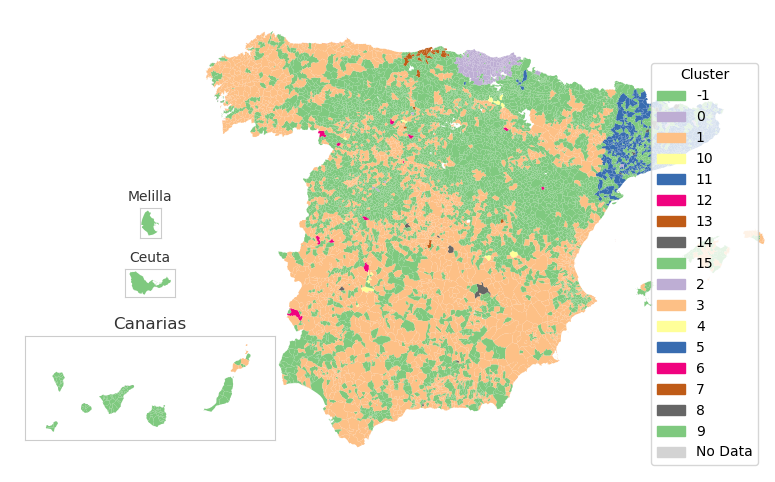

In [52]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='dbscan',
    eps=0.6,
    n_samples=20,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)
fig.savefig('03_images/electoral_dbscan.png', bbox_inches='tight', dpi=300)

### Gaussian Mixture

Clustering Metrics for gaussian:
  Silhouette Score: 0.039102304776164436
  Davies-Bouldin Index: 4.6931134570928235
  Calinski-Harabasz Index: 522.2258335238898

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                           -0.06                        0.49                       0.39                         0.56                                      0.56                                       -0.12        

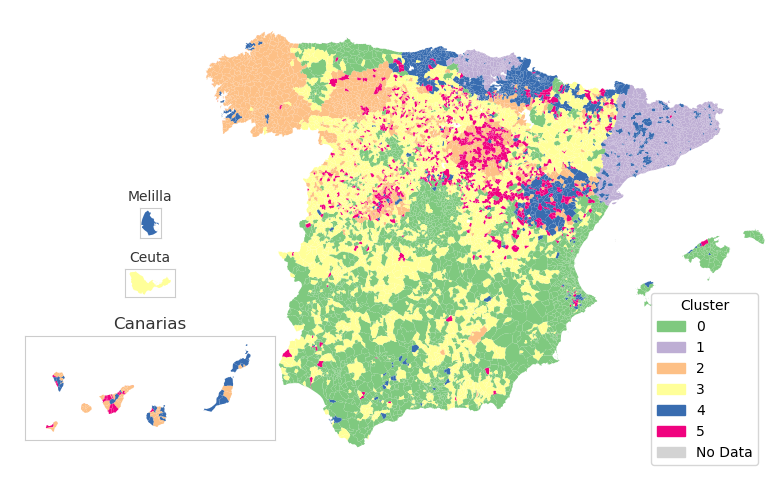

In [53]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='gaussian',
    n_clusters=6,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)

Clustering Metrics for gaussian:
  Silhouette Score: 0.02430286403252164
  Davies-Bouldin Index: 4.623510889978684
  Calinski-Harabasz Index: 462.89351851350114

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                            0.25                        0.56                       0.43                        -0.44                                      0.30                                       -0.36         

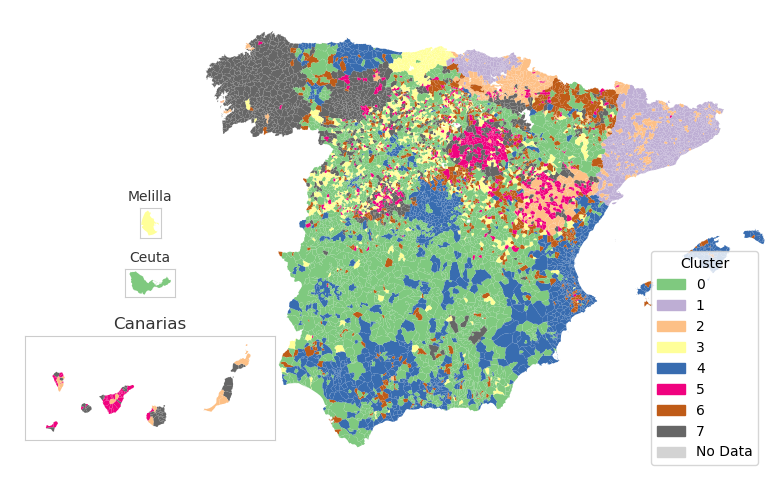

In [54]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='gaussian',
    n_clusters=8,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)

Clustering Metrics for gaussian:
  Silhouette Score: 0.0355132088044256
  Davies-Bouldin Index: 3.908856561552516
  Calinski-Harabasz Index: 512.6972745118145

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                           -0.05                        0.48                       0.41                         0.55                                      0.57                                       -0.11           

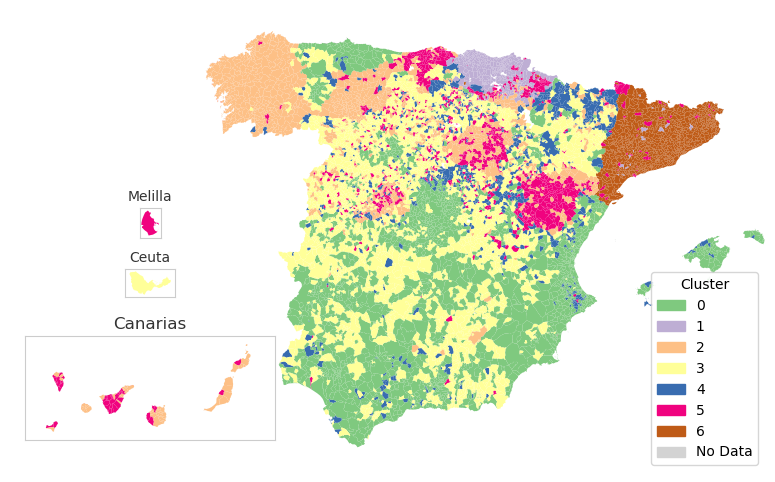

In [55]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='gaussian',
    n_clusters=7,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)

fig.savefig('03_images/electoral_gaussian.png', bbox_inches='tight', dpi=300)

### DEC

Early stopping at epoch 105: Label change delta (0.00086) is below tolerance (0.001).
Clustering Metrics for autoencoder:
  Silhouette Score: 0.07273013000549561
  Davies-Bouldin Index: 2.8779081295537594
  Calinski-Harabasz Index: 851.2540175839847

Cluster Centroids (scaled feature space):
         Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                                                                            
0                            0.49                       -0.05                       0.26                        -0.40      

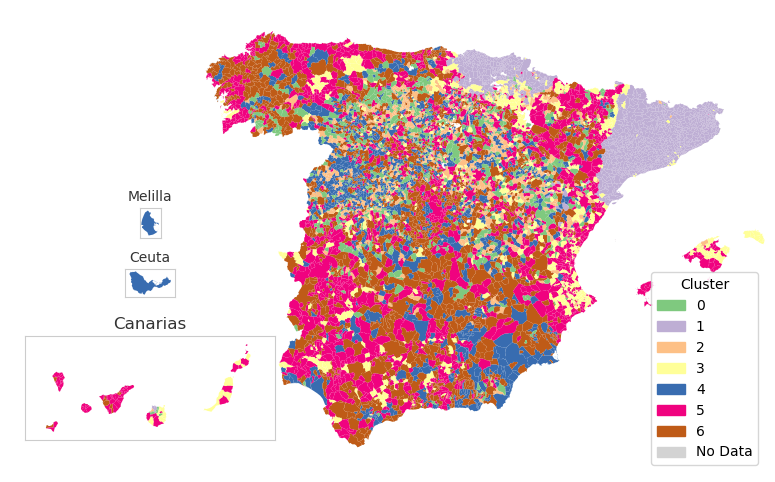

In [56]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables=[
        V_PP_2023,
        V_PSOE_2023,
        V_VOX_2023,
        V_SUMAR_2023,
        V_PP_DIFF_2023_2019,
        V_PSOE_DIFF_2023_2019,
        V_VOX_DIFF_2023_2019,
        V_SUMAR_DIFF_2023_2019
        ],
    algorithm='autoencoder',
    n_clusters=7,
    embedding_dim=3,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)
fig.savefig('03_images/electoral_autoencoder.png', bbox_inches='tight', dpi=300)

## Total using K-Means and the Autoencoder

Clustering Metrics for kmeans:
  Silhouette Score: 0.1346765371455571
  Davies-Bouldin Index: 1.9573504449643508
  Calinski-Harabasz Index: 865.8694111788942

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants  Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                                                                                                                    

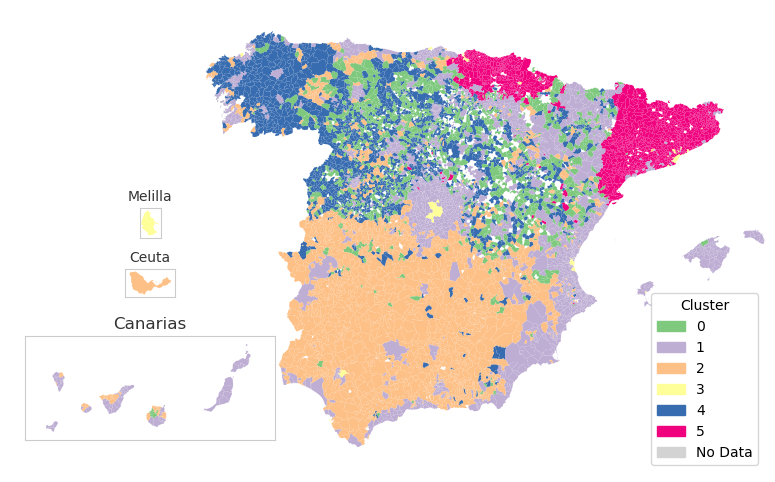

In [57]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables= V_CLUSTERING_BASE,
    algorithm='kmeans',
    n_clusters=6,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)
fig.savefig('03_images/all_kmeans.png', bbox_inches='tight', dpi=300)

Early stopping at epoch 451: Label change delta (0.00080) is below tolerance (0.001).
Clustering Metrics for autoencoder:
  Silhouette Score: 0.004672174455243994
  Davies-Bouldin Index: 8.056537387960699
  Calinski-Harabasz Index: 285.0857670081674

Cluster Centroids (scaled feature space):
         Population density (inhabitants/km2)  Mean age  Foreign-born population (%)  Population with higher education (%)  Population change from 2019 to 2023 (%)  Mean net income per person  Unemployment per 1000 inhabitants  Affiliation to Social Security per 1000 inhabitants  Votes for PP in 2023 (%)  Votes for PSOE in 2023 (%)  Votes for VOX in 2023 (%)  Votes for SUMAR in 2023 (%)  Vote difference for PP from 2019 to 2023  Vote difference for PSOE from 2019 to 2023  Vote difference for VOX from 2019 to 2023  Vote difference for SUMAR from 2019 to 2023
cluster                                                                                                                                        

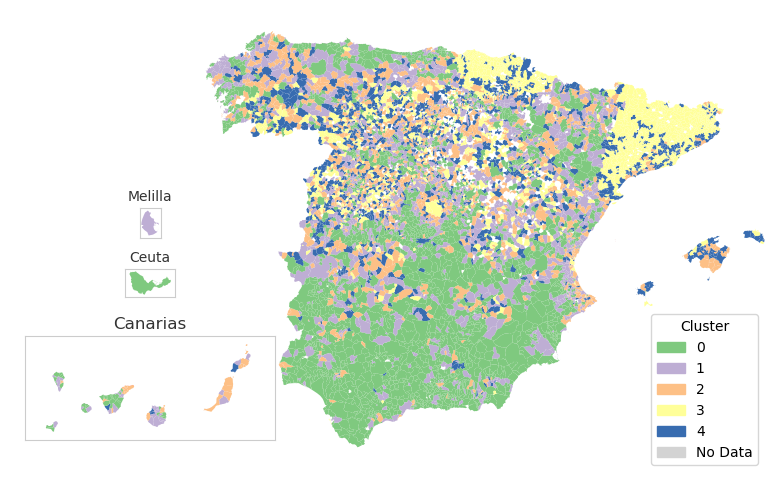

In [58]:
gdf_cluster, metrics, centroids = cl.perform_clustering(
    gdf = gdf,
    variables= V_CLUSTERING_BASE,
    algorithm='autoencoder',
    n_clusters=5,
    embedding_dim=8,
    apply_pca=False
    )

fig, ax = cl.plot_cluster_map(gdf_cluster, title=None)
fig.savefig('03_images/all_autoencoder.png', bbox_inches='tight', dpi=300)